<a href="https://colab.research.google.com/github/JPedroSilveira/visual-computing-deep-learning/blob/main/Computer_Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction to Deep Learning for Visual Computing (INF01050 and CMP620)**
# **Assignment 2**
# Name(s): João Pedro Silveira e Silva

# **Exercise 1**. Download the .zip fle and extract it.

In [1]:
#
#  Common header for all students: download and unzip the dataset
#
! wget https://www.inf.ufrgs.br/~crjung/fdl/cats_dogs_bbs.zip
! unzip cats_dogs_bbs
! ls -l

--2025-05-29 12:06:11--  https://www.inf.ufrgs.br/~crjung/fdl/cats_dogs_bbs.zip
Resolving www.inf.ufrgs.br (www.inf.ufrgs.br)... 143.54.11.34
Connecting to www.inf.ufrgs.br (www.inf.ufrgs.br)|143.54.11.34|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 37809116 (36M) [application/zip]
Saving to: ‘cats_dogs_bbs.zip’

cats_dogs_bbs.zip   100%[===================>]  36.06M  5.27MB/s    in 8.2s    

2025-05-29 12:06:21 (4.41 MB/s) - ‘cats_dogs_bbs.zip’ saved [37809116/37809116]

Archive:  cats_dogs_bbs.zip
  inflating: cat_0.jpg               
  inflating: cat_1.jpg               
  inflating: cat_2.jpg               
  inflating: cat_3.jpg               
  inflating: cat_4.jpg               
  inflating: cat_5.jpg               
  inflating: cat_7.jpg               
  inflating: cat_8.jpg               
  inflating: cat_9.jpg               
  inflating: cat_10.jpg              
  inflating: cat_11.jpg              
  inflating: cat_12.jpg              
  inflatin

# **Exercise 2**. Investigate the train dataset and the annotations, and show some images along with the bounding boxes

Imagens

In [17]:
%ls | grep .jpg | head -n 5

cat_0.jpg
cat_100.jpg
cat_101.jpg
cat_102.jpg
cat_103.jpg


Quantidade de imagens

In [5]:
%ls | grep .jpg | wc -l

1670


Quantidade de imagens de cachorros

In [11]:
%ls | grep dog_ | grep .jpg | wc -l

795


Quantidade de imagens de gatos

In [12]:
%ls | grep cat_ | grep .jpg | wc -l

875


Anotações com arquivo, categoria, coordenadas do centroid e dataset split

In [18]:
%cat annotations.csv | head -n 5

,Unnamed: 0,filename,category,x,y,w,h,split
0,518,cat_634.jpg,cat,108,110,187,210,test
1,754,cat_875.jpg,cat,116,119,214,202,test
2,1483,dog_796.jpg,dog,107,99,212,187,test
3,1478,dog_790.jpg,dog,112,116,172,201,train


Praparando dependências

In [28]:
%pip install opencv-python matplotlib pandas

Funções auxiliares

In [66]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os


def load_annotations_with_single_bouding_box(annotations_path):
    df = pd.read_csv(annotations_path)
    annotations = []
    avoid_duplications = set()
    for index, row in df.iterrows():
        filename = row['filename']
        bbox = [float(row['x']), float(row['y']), float(row['w']), float(row['h'])]
        label = row['category']
        split = row['split']
        if filename not in avoid_duplications:
            annotations.append({
                'filename': filename,
                'bbox': bbox,
                'label': label,
                'split': split
            })
            avoid_duplications.add(filename)
    return annotations

def get_bouding_box_color_by_label(label):
    color = (0, 0, 255)
    if label.lower() == 'cat':
        color = (255, 0, 0)
    elif label.lower() == 'dog':
        color = (0, 255, 0)
    return color

def display_image_with_boxes(annotation):
    filename = annotation['filename']
    x, y, w, h = annotation['bbox']
    label = annotation['label']

    image = cv2.imread(filename)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    x_min = x - (w / 2)
    y_min = y - (h / 2)

    top_left_corner = (int(x_min), int(y_min))
    bottom_right_corner = (int(x_min + w), int(y_min + h))

    color = get_bouding_box_color_by_label(label)
    thickness = 1

    cv2.rectangle(image_rgb, top_left_corner, bottom_right_corner, color, thickness)

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.7
    text_color = color
    cv2.putText(image_rgb, label, (int(x), int(y) - 10), font, font_scale, text_color, thickness)

    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    title = filename
    plt.title(title)
    plt.axis('off')
    plt.show()

Leitura das anotações

In [67]:
annotations = load_annotations_with_single_bouding_box('./annotations.csv')
annotations[:5]

[{'filename': 'cat_634.jpg',
  'bbox': [108.0, 110.0, 187.0, 210.0],
  'label': 'cat',
  'split': 'test'},
 {'filename': 'cat_875.jpg',
  'bbox': [116.0, 119.0, 214.0, 202.0],
  'label': 'cat',
  'split': 'test'},
 {'filename': 'dog_796.jpg',
  'bbox': [107.0, 99.0, 212.0, 187.0],
  'label': 'dog',
  'split': 'test'},
 {'filename': 'dog_790.jpg',
  'bbox': [112.0, 116.0, 172.0, 201.0],
  'label': 'dog',
  'split': 'train'},
 {'filename': 'cat_292.jpg',
  'bbox': [78.0, 107.0, 128.0, 164.0],
  'label': 'cat',
  'split': 'train'}]

Imprimir n exemplos em ordem aleatória

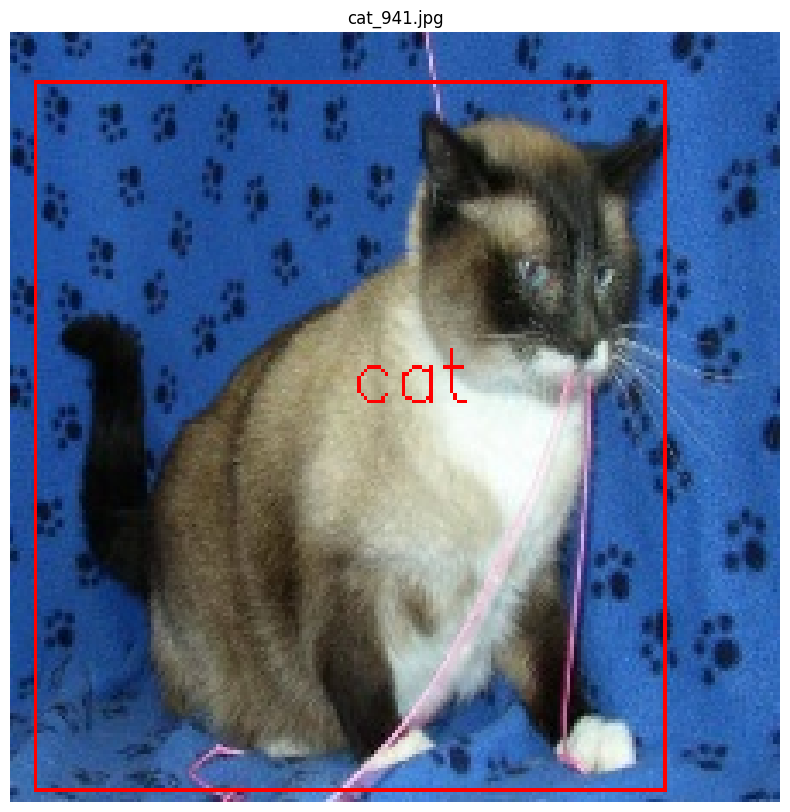

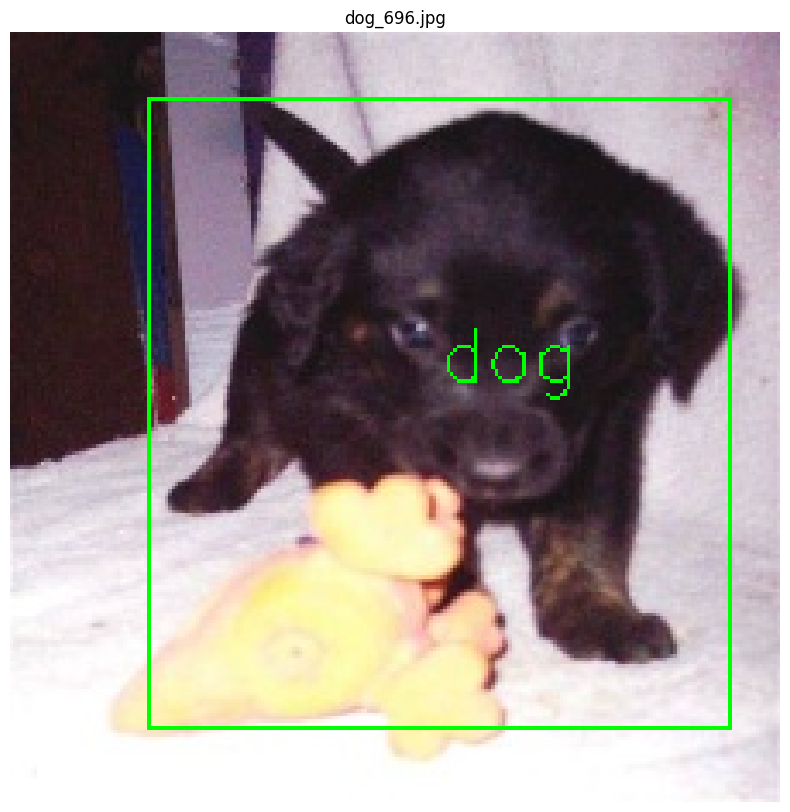

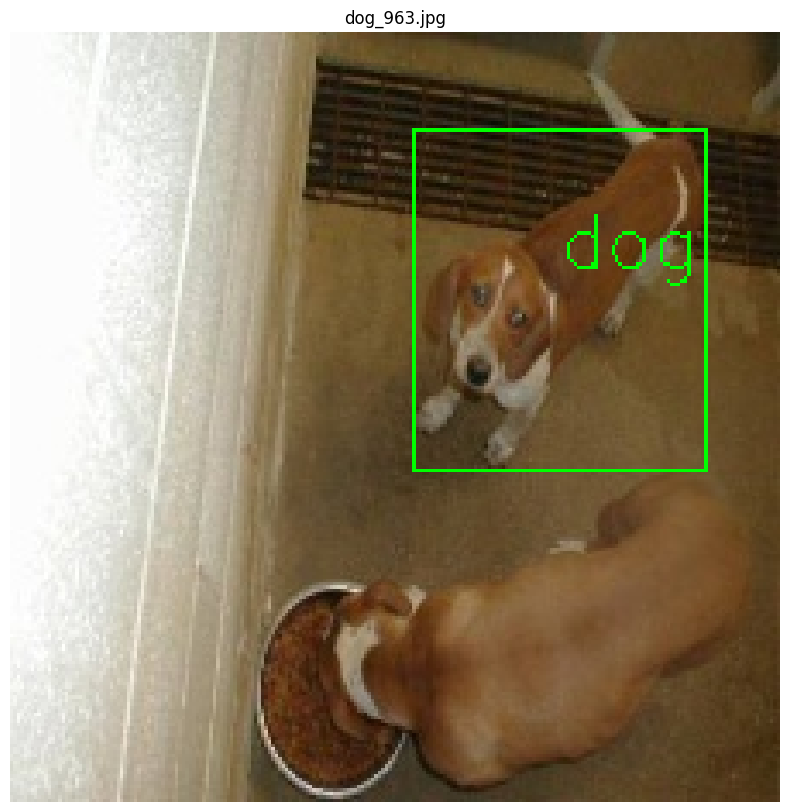

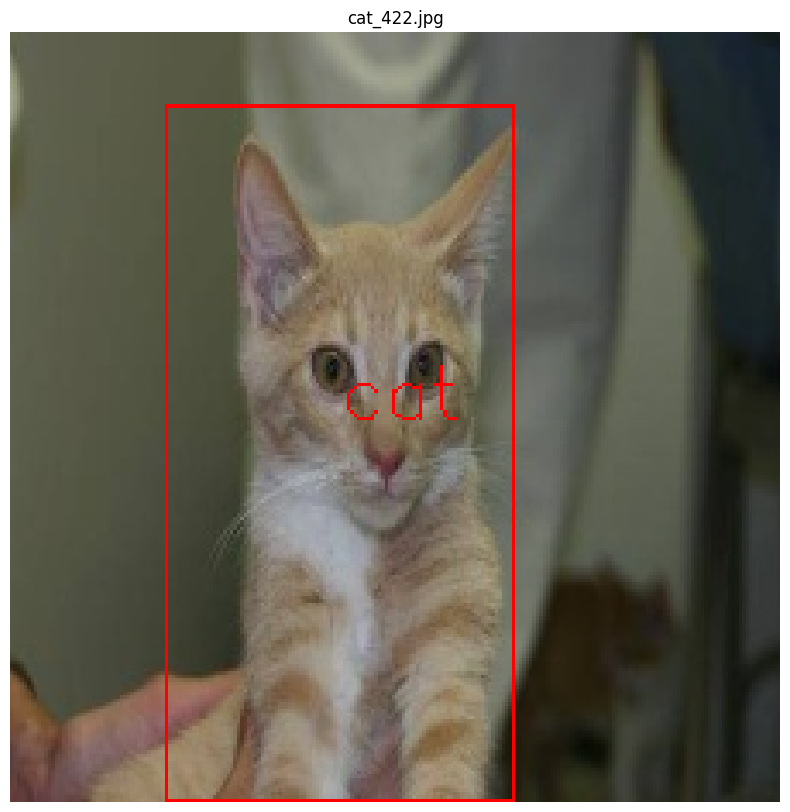

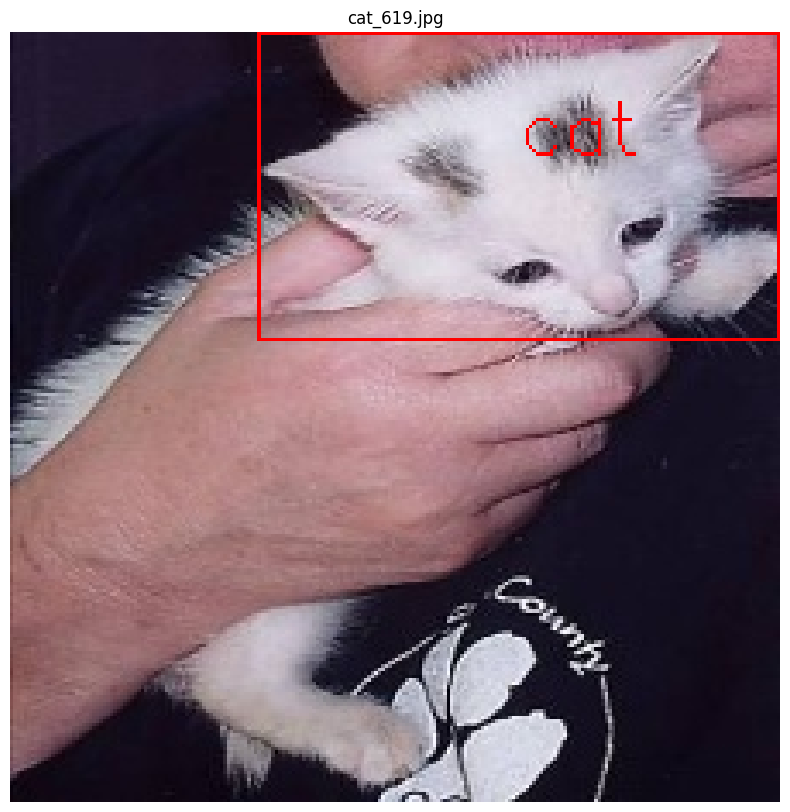

In [208]:
import random

num_examples_to_show = 5
count = 0

random.shuffle(annotations)

for annotation in annotations:
    if count >= num_examples_to_show:
        break
    display_image_with_boxes(annotation)
    count +=1

Corrige anotações baseado no nome do arquivo (Opcional)

**Após verificação manual foi possível detectar que o nome do arquivo estava correto em todos os casos**

Primeira execução retornará mais de 100 errors, segunda não deve retornar nada

In [92]:
from IPython.display import Image, display, clear_output


total_inconsistencies = 0

for annotation in annotations:
    label = annotation['label']
    filename = annotation['filename']
    if not filename.startswith(label):
        print(f"Classificado como {label} | {filename}")
        display(Image(annotation['filename']))
        if filename.startswith('cat'):
            annotation['label'] = 'cat'
        else:
            annotation['label'] = 'dog'
        total_inconsistencies = total_inconsistencies + 1

print(f"Total de inconsistências corrigidas: {total_inconsistencies}")

Total de inconsistências corrigidas: 0


Removendo arquivos inconsistentes

*   dog_7.jpg possuí tanto um cachorro quanto um gato

Primeira execução retornará a imagem removida, segunda não deve retornar nada


In [95]:
files_to_remove = ['dog_7.jpg']
filtered_annotations = []

for annotation in annotations:
    filename = annotation['filename']
    if filename in files_to_remove:
        print(f"Removing file {filename}")
        display_image_with_boxes(annotation)
    else:
        filtered_annotations.append(annotation)

annotations = filtered_annotations

# **Exercise 3**. Think of a suitable architecture that takes as input a fixed-resolution image and outputs four coordinates of the bounding boxes.

You can choose how to parametrize the output of the network (e.g., top-left and dimensions, top-left and bottom-right, etc.), but it is strongly
suggested that you think of coordinates that are relative to the image dimensions.
Think of suitable activation functions for the regression head and loss function to train your model. It is crucial to justify your choices.

Preparar dependências

In [99]:
%pip install torch torchvision torchaudio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

Definição dos tamanhos das imagens

In [101]:
IMG_WIDTH = 224
IMG_HEIGHT = 224
IMAGE_CHANNELS = 3
IMAGE_SIZE = (IMG_HEIGHT, IMG_WIDTH)

Definição de parametros de treino

In [241]:
BATCH_SIZE = 16
EPOCHS = 75
VALIDATION_RATIO = 0.15

Definição de dependências

In [194]:
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torchvision.ops as ops
from PIL import Image
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import torchvision.transforms.functional as FV
from torchvision.utils import draw_bounding_boxes
import torchvision

Codificação das labels

In [104]:
label_map = {'cat': 0, 'dog': 1}

def encode_label(label):
    return label_map[label]

Definição do dataset para PyTorch

In [209]:
class BBoxDataset(Dataset):
    def __init__(self, annotations):
        self.annotations = annotations
        self.transform = transforms.Compose([
            transforms.Resize(IMAGE_SIZE),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        ann = self.annotations[idx]
        image = Image.open(ann['filename']).convert('RGB')
        original_width, original_height = image.size
        resized_width, resized_height = IMG_WIDTH, IMG_HEIGHT

        image = self.transform(image)

        cx, cy, w, h = ann['bbox']

        xmin = cx - (w / 2)
        ymin = cy - (h / 2)
        xmax = xmin + w
        ymax = ymin + h

        scale_x = resized_width / original_width
        scale_y = resized_height / original_height

        xmin *= scale_x
        xmax *= scale_x
        ymin *= scale_y
        ymax *= scale_y

        bbox = torch.tensor([xmin, ymin, xmax, ymax], dtype=torch.float32)
        label = torch.tensor(encode_label(ann['label']), dtype=torch.long)

        return image, bbox, label

Carregamento do dataset

In [210]:
train_annotations = [ann for ann in annotations if ann['split'] == 'train']
test_annotations = [ann for ann in annotations if ann['split'] == 'test']
train_annotations, validation_annotations = train_test_split(
    train_annotations,
    test_size=VALIDATION_RATIO,
    random_state=42,
    shuffle=True
)

print(len(train_annotations))
print(len(validation_annotations))
print(len(test_annotations))

969
172
528


In [211]:
train_dataset = BBoxDataset(train_annotations)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
validation_dataset = BBoxDataset(validation_annotations)
validation_dataloader = DataLoader(validation_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_dataset = BBoxDataset(test_annotations)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)

print(len(train_dataset))
print(len(validation_dataset))
print(len(test_dataset))

969
172
528


Exibe alguns exemplos adaptados do dataset para verificar consistências de redimensionamento

In [232]:
def show_sample(image_tensor, bbox_tensor, label_tensor, label_map=None):
    img = (image_tensor * 255).to(torch.uint8)

    boxes = bbox_tensor.unsqueeze(0)

    labels = [list(label_map.keys())[list(label_map.values()).index(label_tensor.item())]]

    label_to_color = {
        'cat': 'red',
        'dog': 'green',
    }

    colors = [label_to_color[label] for label in labels]

    img_with_box = draw_bounding_boxes(img, boxes, labels=labels, colors=colors, width=1)

    plt.imshow(FV.to_pil_image(img_with_box))
    plt.axis('off')
    plt.show()

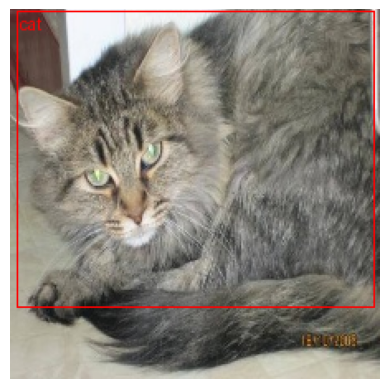

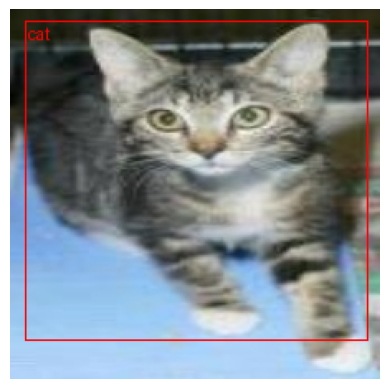

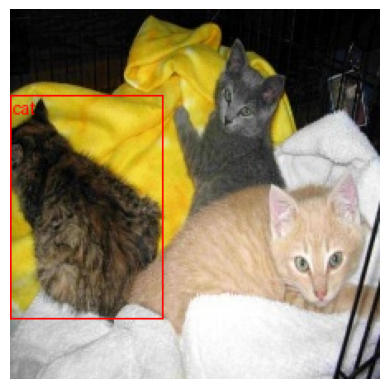

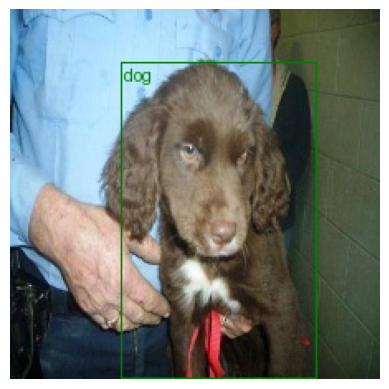

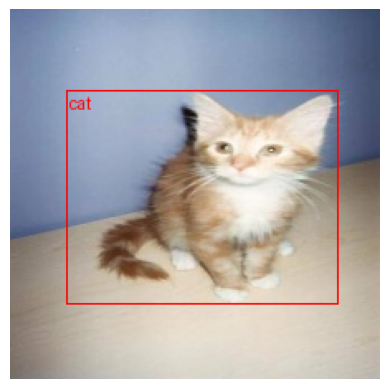

In [234]:
random_idx = random.sample(range(0, len(train_dataset) + 1), k=5)

for idx in random_idx:
    image, bbox, label = train_dataset[idx]
    show_sample(image, bbox, label, label_map)

Definição do modelo

In [217]:
class BBoxModel(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.backbone = models.resnet34(pretrained=True)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()
        self.classifier = nn.Linear(in_features, num_classes)
        self.bbox_regressor = nn.Linear(in_features, 4)

    def forward(self, x):
        x = self.backbone(x)
        class_logits = self.classifier(x)
        bboxes = self.bbox_regressor(x)
        return class_logits, bboxes

Definição do device a ser utilizado

In [218]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Inicialização do modelo

In [242]:
model = BBoxModel(num_classes=len(label_map)).to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Definição de Loss


*   Para definição da classe estamos utilizando a Cross Entropy Loss assim como no trabalho anterior
*   Para definição da bounding box estamos utilizando a CIoU Loss (Complete Intersection over Union), pois está considera a área de overlap (IoU) o que é uma métrica importante para definir a cobertura da bouding box, e também a distância do centróide predito do original e o aspect ratio.



In [243]:
criterion_cls = F.cross_entropy #nn.CrossEntropyLoss()
criterion_bbox = F.l1_loss #nn.MSELoss() #ops.complete_box_iou_loss#(predicted_boxes, gt_boxes, reduction='mean')

Definição de otimizador

*   Iremos iniciar pelo Adam devido a boa performance oferecida no primeira Assignment 1


In [244]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# **Exercise 4**. Train the developed model (use a validation set, obtained from training data, to assess over-fitting)

In [245]:
for epoch in range(EPOCHS):
    model.train()
    total_cls_loss, total_bbox_loss = 0, 0
    for images, bboxes, labels in train_dataloader:
        images = images.to(device)
        bboxes = bboxes.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs_cls, outputs_bbox = model(images)

        loss_cls = criterion_cls(outputs_cls, labels, reduction="mean")
        loss_bbox = criterion_bbox(outputs_bbox, bboxes, reduction="mean")

        loss = loss_cls + loss_bbox

        loss.backward()
        optimizer.step()

        total_cls_loss += loss_cls.item()
        total_bbox_loss += loss_bbox.item()

    print(f"[Train] [Epoch {epoch+1}], Cls Loss: {total_cls_loss:.4f}, BBox Loss: {total_bbox_loss:.4f}")
    model.eval()
    val_cls_loss, val_bbox_loss = 0.0, 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, bboxes, labels in validation_dataloader:
            images = images.to(device)
            bboxes = bboxes.to(device)
            labels = labels.to(device)

            preds_cls, preds_bbox = model(images)

            loss_cls = criterion_cls(preds_cls, labels, reduction="mean")
            loss_bbox = criterion_bbox(preds_bbox, bboxes, reduction="mean")

            val_cls_loss += loss_cls.item()
            val_bbox_loss += loss_bbox.item()

            _, predicted = preds_cls.max(1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    accuracy = correct / total * 100
    print(f"[Validation] [Epoch {epoch+1}]  Cls Loss: {val_cls_loss:.4f}, BBox Loss: {val_bbox_loss:.4f}, Acc: {accuracy:.2f}%")

test_cls_loss, test_bbox_loss = 0.0, 0.0
model.eval()
with torch.no_grad():
    for images, bboxes, labels in test_dataloader:
        images = images.to(device)
        bboxes = bboxes.to(device)
        labels = labels.to(device)

        preds_cls, preds_bbox = model(images)

        loss_cls = criterion_cls(preds_cls, labels, reduction="mean")
        loss_bbox = criterion_bbox(preds_bbox, bboxes, reduction="mean")

        test_cls_loss += loss_cls.item()
        test_bbox_loss += loss_bbox.item()

        _, predicted = preds_cls.max(1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    accuracy = correct / total * 100
    print(f"[Test] Cls Loss: {test_cls_loss:.4f}, BBox Loss: {test_bbox_loss:.4f}, Acc: {accuracy:.2f}%")

[Train] [Epoch 1], Cls Loss: 6.7857, BBox Loss: 6846.8211
[Validation] [Epoch 1]  Cls Loss: 0.4804, BBox Loss: 1224.3647, Acc: 97.67%
[Train] [Epoch 2], Cls Loss: 4.0629, BBox Loss: 6611.4797
[Validation] [Epoch 2]  Cls Loss: 1.2252, BBox Loss: 1181.2062, Acc: 96.51%
[Train] [Epoch 3], Cls Loss: 5.4350, BBox Loss: 6374.1812
[Validation] [Epoch 3]  Cls Loss: 0.9800, BBox Loss: 1134.5107, Acc: 99.42%
[Train] [Epoch 4], Cls Loss: 5.7008, BBox Loss: 6136.4942
[Validation] [Epoch 4]  Cls Loss: 2.1496, BBox Loss: 1103.8535, Acc: 91.86%
[Train] [Epoch 5], Cls Loss: 5.8615, BBox Loss: 5906.4822
[Validation] [Epoch 5]  Cls Loss: 1.5761, BBox Loss: 1072.2516, Acc: 95.93%
[Train] [Epoch 6], Cls Loss: 5.3203, BBox Loss: 5679.6388
[Validation] [Epoch 6]  Cls Loss: 1.1767, BBox Loss: 1005.3311, Acc: 97.09%
[Train] [Epoch 7], Cls Loss: 5.0506, BBox Loss: 5450.7592
[Validation] [Epoch 7]  Cls Loss: 1.4770, BBox Loss: 985.7237, Acc: 96.51%
[Train] [Epoch 8], Cls Loss: 6.2446, BBox Loss: 5232.9458
[Vali

**Note que por ser um modelo pré-treinado a acurácia de classificação é alta desde o ínicio, enquanto a loss para bouding box melhora com o tempo. Note também que enquanto a loss para a bouding box melhora a loss de classificação sobre declínios devido a ter um valor muito menor, causando uma baixa prioridade.**

# **Exercise 5**. Run the model in both the train and test sets, and evaluate the results:



*   Qualitatively: show some test images along with the Ground-Truth (GT) bounding boxes and the predictions of the model
*   Quantitatively: compute the Intersection-over-Union (IoU) between the GT and predicted boxes. Given an IoU threshold T, compute the fraction of predictions that are considered correct according to the threshold (let us call this metric A@T, meaning accuracy at the threshold T)



## Qualitatively: show some test images along with the Ground-Truth (GT) bounding boxes and the predictions of the model

**Using test dataset**

Actual:


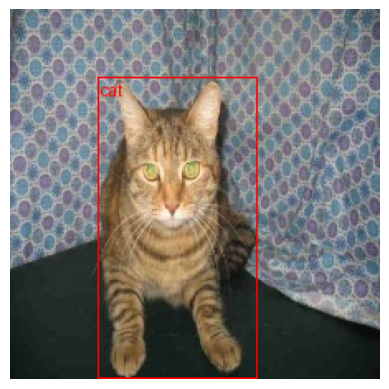

Prediction:


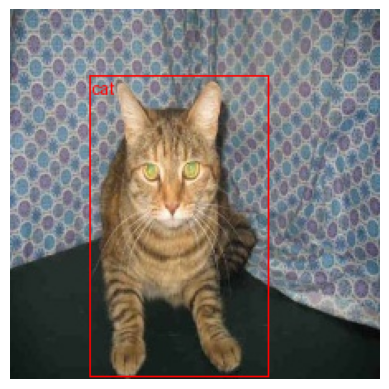

Actual:


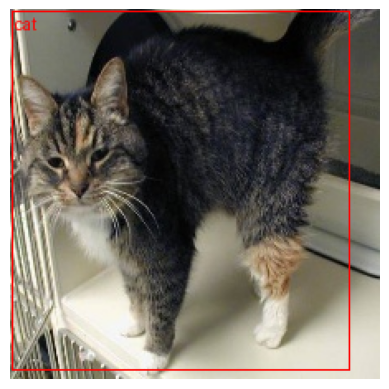

Prediction:


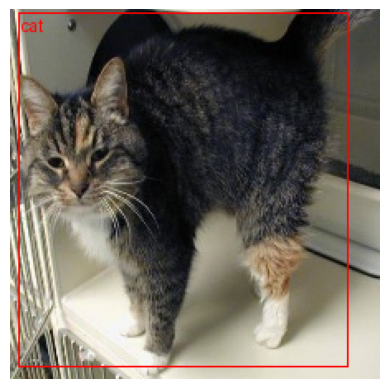

Actual:


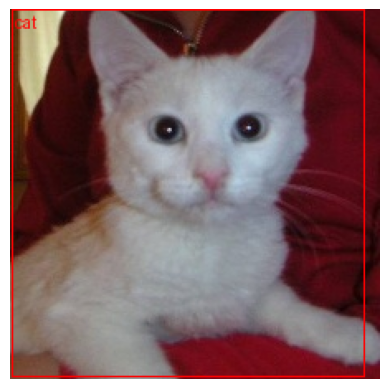

Prediction:


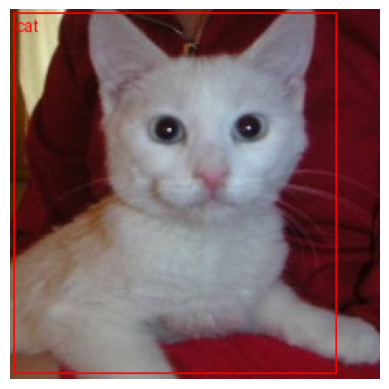

Actual:


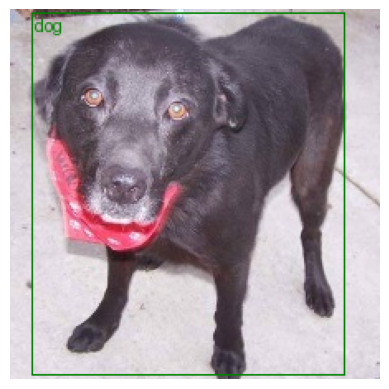

Prediction:


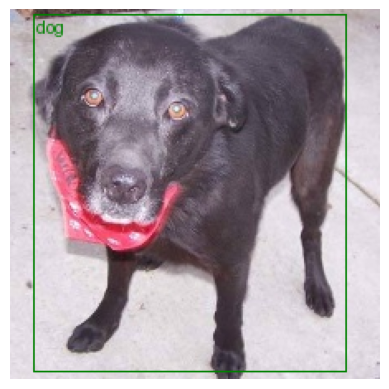

Actual:


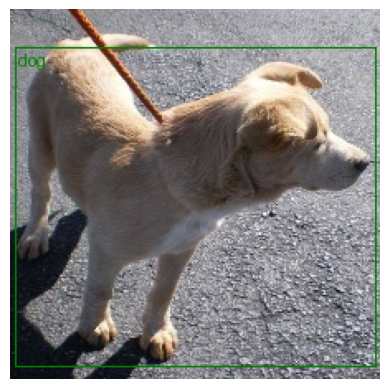

Prediction:


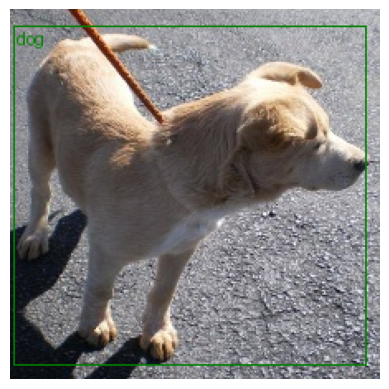

Actual:


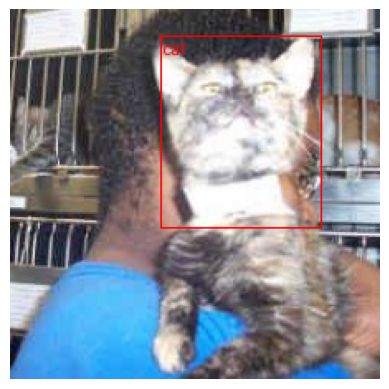

Prediction:


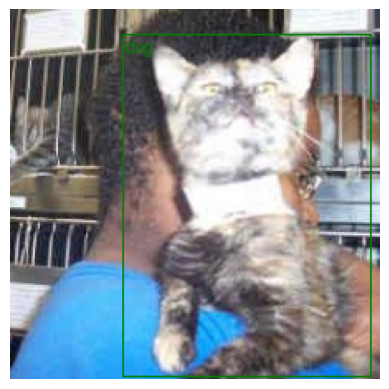

Actual:


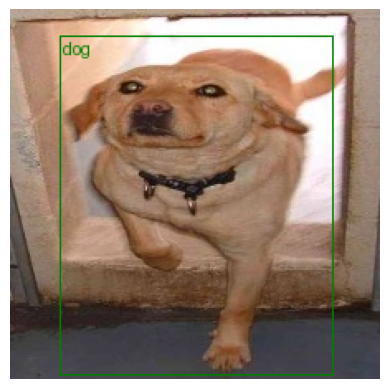

Prediction:


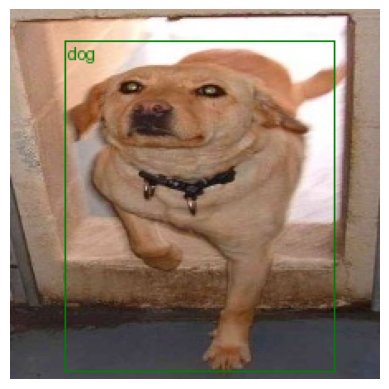

Actual:


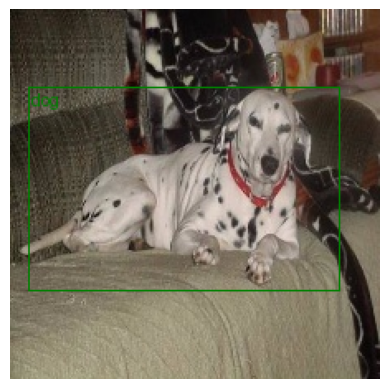

Prediction:


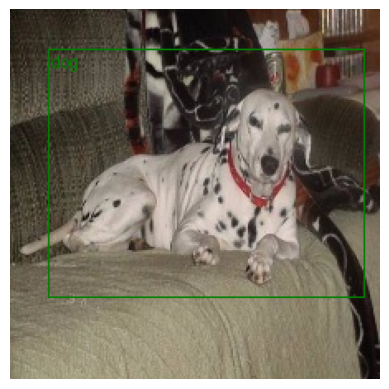

Actual:


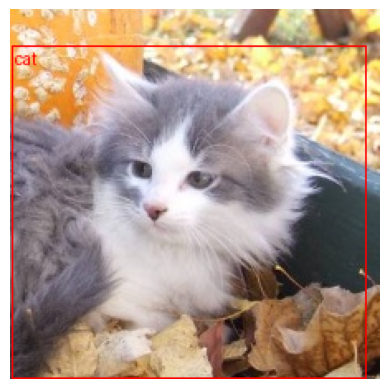

Prediction:


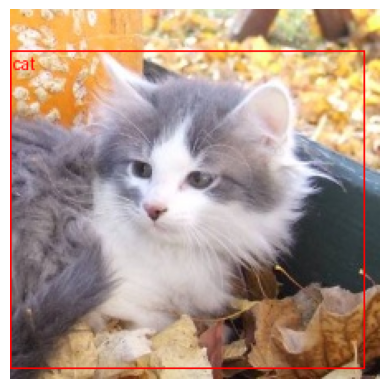

Actual:


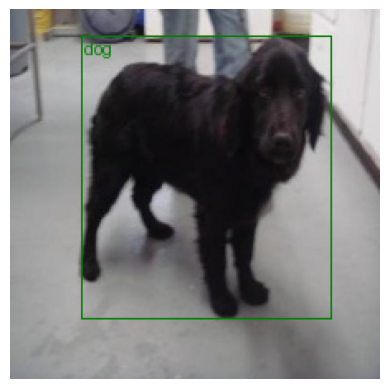

Prediction:


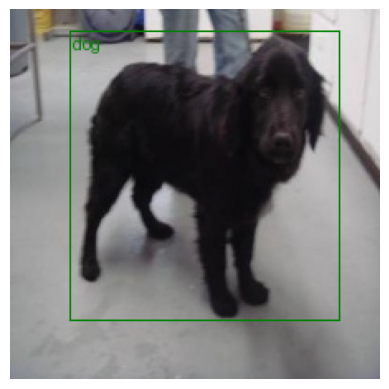

Actual:


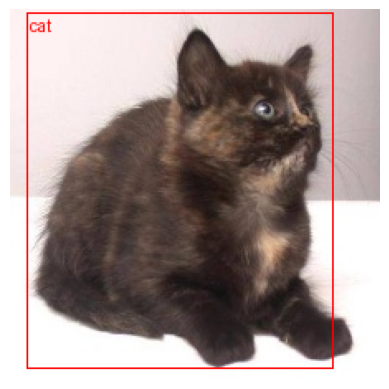

Prediction:


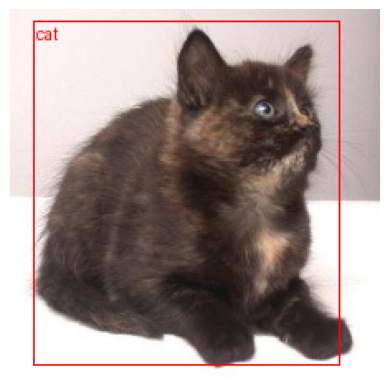

Actual:


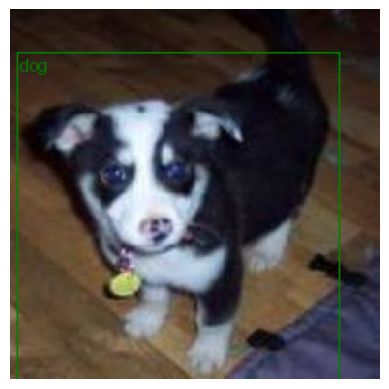

Prediction:


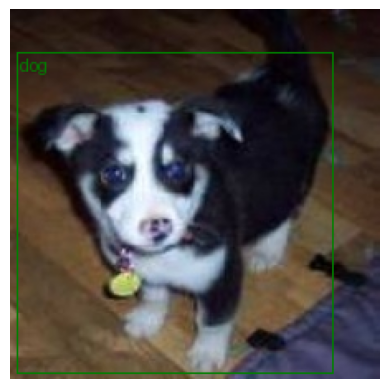

Actual:


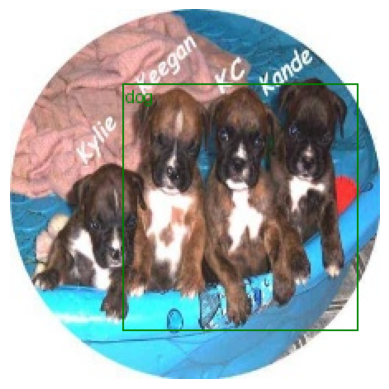

Prediction:


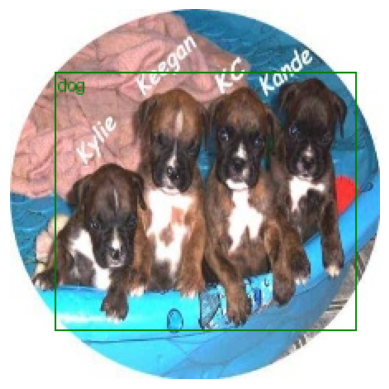

Actual:


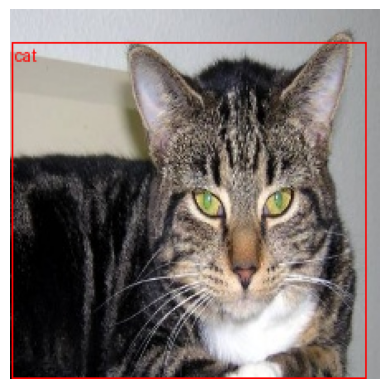

Prediction:


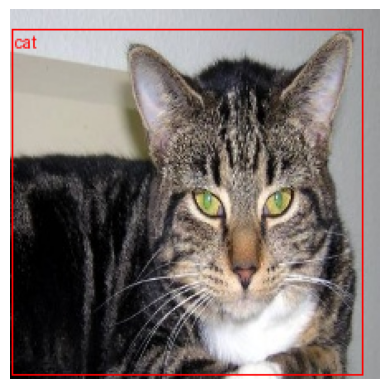

Actual:


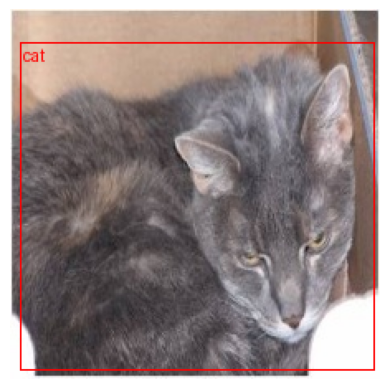

Prediction:


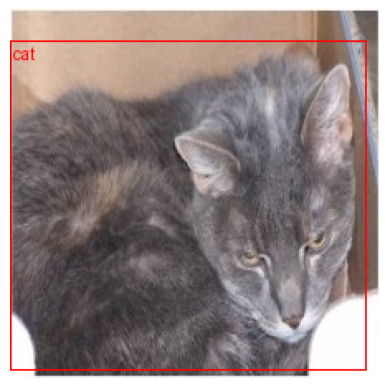

Actual:


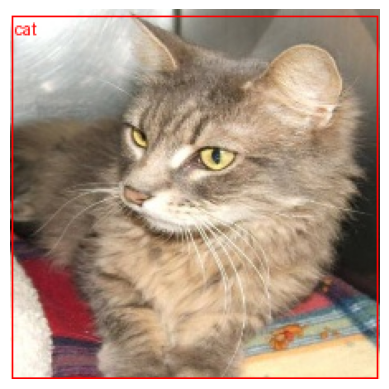

Prediction:


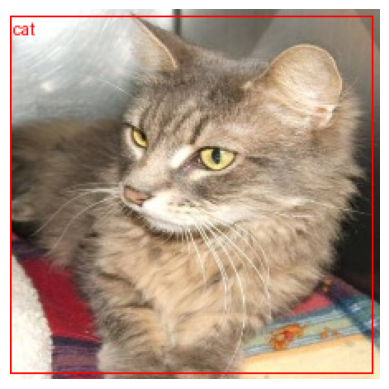

In [272]:
model.eval()
with torch.no_grad():
  for images, bboxes, labels in test_dataloader:
      preds_cls, preds_bbox = model(images.to(device))
      for idx in range(len(images)):
        image = images[idx]
        bbox = bboxes[idx]
        label = labels[idx]
        print("Actual:")
        show_sample(image, bbox, label, label_map)

        p_bbox = preds_bbox[idx]
        p_label = torch.argmax(preds_cls[idx])
        print("Prediction:")
        show_sample(image, p_bbox, p_label, label_map)
      break;

### É possível notar uma boa performance do modelo nas imagens de teste

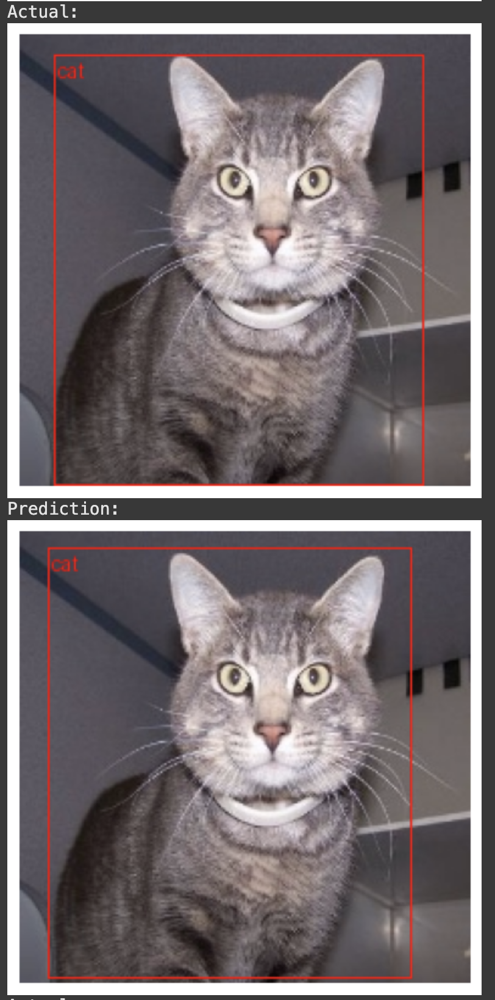

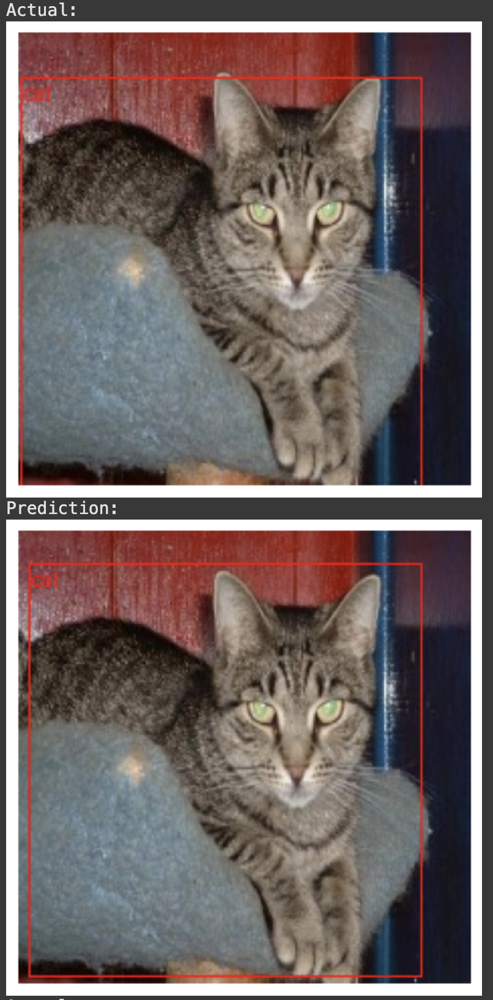

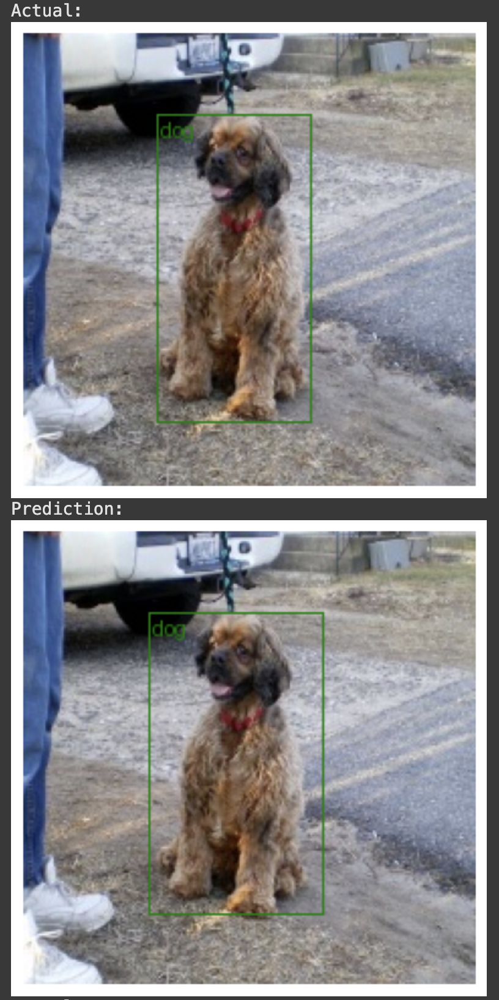

### Em alguns casos houve um aumento considerável da bouding box, nem sempre negativo

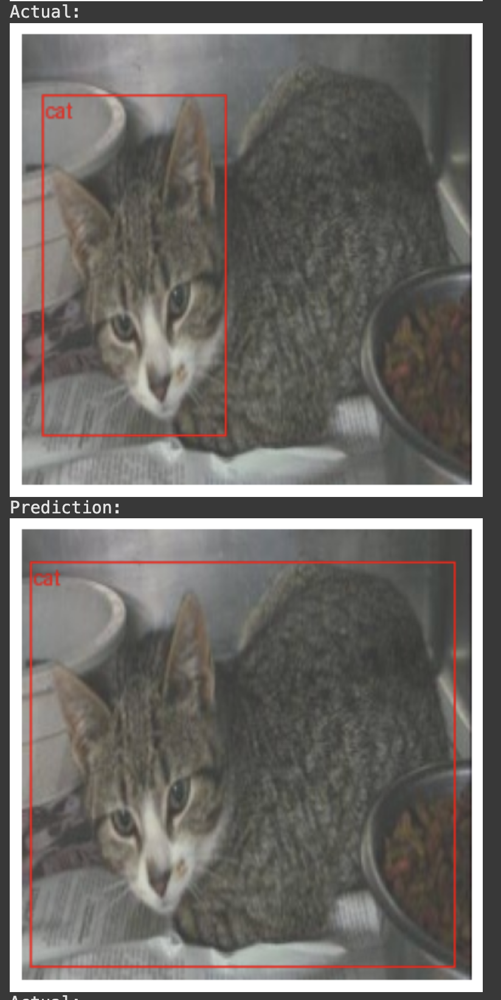

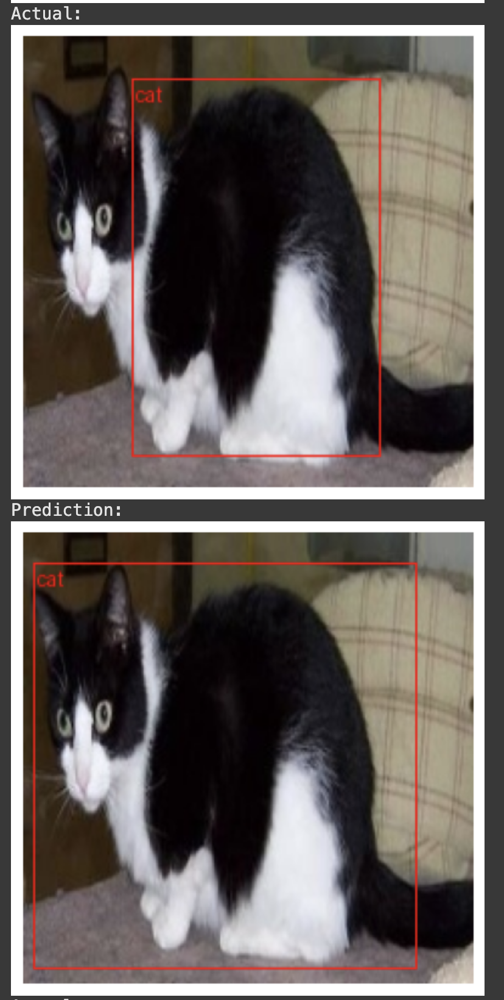

## Quantitatively: compute the Intersection-over-Union (IoU) between the GT and predicted boxes.

Given an IoU threshold T, compute the fraction of predictions that are considered correct according to the threshold (let us call this metric A@T, meaning accuracy at the threshold T).

**Using train and test datasets**

Calculate the Intersection over Union (IoU)

In [274]:
def calculate_iou(bb1, bb2):
    x_min1, y_min1, x_max1, y_max1 = bb1
    x_min2, y_min2, x_max2, y_max2 = bb2

    x_min_inter = max(x_min1, x_min2)
    y_min_inter = max(y_min1, y_min2)
    x_max_inter = min(x_max1, x_max2)
    y_max_inter = min(y_max1, y_max2)

    width_inter = x_max_inter - x_min_inter
    height_inter = y_max_inter - y_min_inter

    if width_inter <= 0 or height_inter <= 0:
        area_inter = 0.0
    else:
        area_inter = width_inter * height_inter

    area_box1 = (x_max1 - x_min1) * (y_max1 - y_min1)
    area_box2 = (x_max2 - x_min2) * (y_max2 - y_min2)

    area_union = area_box1 + area_box2 - area_inter

    if area_union == 0:
        iou = 0.0
    else:
        iou = area_inter / area_union

    return iou

Calculate the Accuracy at Threshold (A@T)

In [275]:
def calculate_accuracy_at_threshold(gt_bb, pred_bb, threshold):
    assert len(gt_bb) == len(pred_bb)
    correct = 0
    total = len(gt_bb)

    for gt_bb, pred_bb in zip(gt_bb, pred_bb):
        iou = calculate_iou(gt_bb, pred_bb)
        if iou >= threshold:
            correct += 1

    return correct / total if total > 0 else 0.0

Calculate the A@T for dataset

In [276]:
def calculate_accuracy_at_threshold_for_dataset(dataloader, threshold):
  gt_boxes = []
  pred_boxes = []

  model.eval()
  with torch.no_grad():
    for images, bboxes, labels in dataloader:
        preds_cls, preds_bbox = model(images.to(device))
        for idx in range(len(images)):
          bbox = bboxes[idx]
          p_bbox = preds_bbox[idx]
          gt_boxes.append(bbox)
          pred_boxes.append(p_bbox)

  a_at_t = calculate_accuracy_at_threshold(gt_boxes, pred_boxes, threshold)
  print(f"A@{threshold}: {a_at_t:.2f}")

A@T using train dataloader

In [277]:
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.925, 0.95]

for threshold in thresholds:
  calculate_accuracy_at_threshold_for_dataset(train_dataloader, threshold)

A@0.1: 1.00
A@0.2: 1.00
A@0.3: 1.00
A@0.4: 1.00
A@0.5: 1.00
A@0.6: 0.99
A@0.7: 0.98
A@0.8: 0.95
A@0.9: 0.87
A@0.925: 0.80
A@0.95: 0.62


A@T using test dataloader

In [278]:
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.925, 0.95]

for threshold in thresholds:
  calculate_accuracy_at_threshold_for_dataset(test_dataloader, threshold)

A@0.1: 1.00
A@0.2: 0.99
A@0.3: 0.98
A@0.4: 0.96
A@0.5: 0.95
A@0.6: 0.91
A@0.7: 0.87
A@0.8: 0.76
A@0.9: 0.39
A@0.925: 0.22
A@0.95: 0.10


# **Exercise 6**. Discuss the obtained results, in particular the behavior of A@T as you select tighter thresholds and any discrepancy between the train and test sets.

Visually the results seems great.
As we are using an pre-trained model it already started with a huge classification score, which is actually greater than the score at the end of the training using validation.
During training the bouding box loss is prioritized as the model have a lower score on it.
The basic MSE loss worked well, resulting is a good prediction performance.

When evaluating the model using A@T ew can see a huge difference between test and train. On test we got results of 1.0 until a threshold of 0.5 and on test we got it only with 0.1.
The results until 0.6 stills higher than 0.9 for test dataset, the same happens for train until the threashold of 0.8.

Visually we could confirm that in some cases the results of the model are even better than the GT, mainly when the GT bouding box does not contain the whole animal on it.

Some things can be added to improve the performance:


*   Change the pre trained model
*   Add augmentation
*   Improve the Loss function to a better one as Complete-IoU (CIoU) which considers three geometric factors: overlap area (IoU), central point distance, and aspect ratio consistency.
